In [5]:
# import sys
# sys.path.insert(0, '/home/users/brezovec/.local/lib/python3.6/site-packages/lib/python/')
# import ants
# import os
# import bigbadbrain as bbb
# import numpy as np
# import matplotlib.pyplot as plt
# import time
# import scipy
# from scipy.ndimage.filters import gaussian_filter
# from scipy.signal import savgol_filter
# from scipy.interpolate import interp1d

# from skimage.filters import threshold_triangle
# sys.path.insert(0, '/home/users/brezovec/.local/lib/python3.6/site-packages')
# import os
# import statsmodels.api as sm
# import cv2
# import matplotlib.patches as mpatches
# import psutil
# from mpl_toolkits.axes_grid1 import ImageGrid
# from matplotlib.colors import Normalize


# %matplotlib inline
# plt.rcParams.update({'font.size': 20})

# from sklearn.feature_extraction.image import grid_to_graph
# from mpl_toolkits.axes_grid1 import ImageGrid
# import json
# from matplotlib.ticker import FuncFormatter

# import nibabel as nib

# from sklearn.cluster import AgglomerativeClustering
# from scipy.cluster.hierarchy import dendrogram
# import itertools
# import random
# from scipy.cluster import hierarchy
# import matplotlib as mpl
# from matplotlib.pyplot import cm

# from scipy.interpolate import UnivariateSpline
# from sklearn.linear_model import LinearRegression

# import pickle
# from sklearn.decomposition import PCA
# from sklearn.linear_model import RidgeCV
# from sklearn.linear_model import LassoCV
# from sklearn.linear_model import Ridge
# import pickle

# from scipy.ndimage.morphology import binary_erosion
# from scipy.ndimage.morphology import binary_dilation

# import brainsss

In [8]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from time import time
import scipy
import nibabel as nib
import matplotlib as mpl
%matplotlib inline
import brainsss
import h5py
import pickle
from scipy.interpolate import interp1d

In [9]:
def get_stimulus_metadata(vision_path):

    ### try to get from pickle ###
    pickle_path = os.path.join(vision_path, 'stimulus_metadata.pkl')
    if os.path.exists(pickle_path):
        print("Loaded from Pickle.")
        with open(pickle_path, 'rb') as f:
            metadata = pickle.load(f)
        return metadata['stim_ids'], metadata['angles']

    ### if no pickle, load from .h5 and save pickle for future ###
    print("No pickle; parsing visprotocol .h5")
    fname = [x for x in os.listdir(vision_path) if '.hdf5' in x][0]
    visprotocol_file = os.path.join(vision_path, fname)

    stim_ids = []
    angles = []
    with h5py.File(visprotocol_file, 'r') as f:

        ### loop over flies and series to find the one that has many stim presentations (others were aborted)
        # note it is critical each fly has their own .h5 file saved
        fly_ids = list(f['Flies'].keys())
        print("Found fly ids: {}".format(fly_ids))
        for fly_id in fly_ids:

            series = list(f['Flies'][fly_id]['epoch_runs'].keys())
            print("Found series: {}".format(series))
            for serie in series:

                epoch_ids = f['Flies'][fly_id]['epoch_runs'][serie].get('epochs').keys()
                print(str(len(epoch_ids)))
                for i, epoch_id in enumerate(epoch_ids):
                    stim_id = f['Flies'][fly_id]['epoch_runs'][serie].get('epochs').get(epoch_id).attrs['component_stim_type']
                    stim_ids.append(stim_id)
                    if stim_id == 'DriftingSquareGrating':
                        angle = f['Flies'][fly_id]['epoch_runs'][serie].get('epochs').get(epoch_id).attrs['angle']
                        angles.append(angle)
                    else:
                        angles.append(None)

                if len(stim_ids) > 100:

                    ### save pickle for next time
                    metadata = {'stim_ids': stim_ids, 'angles': angles}
                    save_file = os.path.join(vision_path, 'stimulus_metadata.pkl')
                    with open(save_file, 'wb') as f:
                        pickle.dump(metadata, f)
                    print("created {}".format(save_file))

                    return stim_ids, angles
        print('Could not get visual metadata.')

In [10]:
func_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20190101_walking_dataset/fly_116/func_0/'

In [21]:
###########################
### PREP VISUAL STIMULI ###
###########################

vision_path = os.path.join(func_path, 'visual')

### Load Photodiode ###
t, ft_triggers, pd1, pd2 = brainsss.load_photodiode(vision_path)
stimulus_start_times = brainsss.extract_stim_times_from_pd(pd2, t)

### Get Metadata ###
stim_ids, angles = get_stimulus_metadata(vision_path)
print(F"Found {len(stim_ids)} presented stimuli.")

# *100 puts in units of 10ms, which will match fictrac
starts_angle_0 = [int(stimulus_start_times[i]*100) for i in range(len(stimulus_start_times)) if angles[i] == 0]
starts_angle_180 = [int(stimulus_start_times[i]*100) for i in range(len(stimulus_start_times)) if angles[i] == 180]
print(F"starts_angle_0: {len(starts_angle_0)}. starts_angle_180: {len(starts_angle_180)}")
list_in_ms0 = [i*10 for i in starts_angle_0]

loading photodiode data... done
Loaded from Pickle.
Found 269 presented stimuli.
starts_angle_0: 88. starts_angle_180: 88


In [86]:
index_n =(2,11,15,16,23,27,32,37,38,40,42,78,82)
new_list = []
for i in index_n:
    new_list.append(list_in_ms0[i])
#[2,11,15,16,23,27,32,37,38,40,42,78,82]
list_in_ms0 = new_list

In [22]:
brain_path = os.path.join(func_path, 'functional_channel_2_moco_zscore_highpass.h5')

In [23]:
timestamps = brainsss.load_timestamps(os.path.join(func_path, 'imaging'), file='functional.xml')

Trying to load timestamp data from hdf5 file.
Success.


In [14]:
timestamps.shape

(3384, 49)

In [15]:
z=-1
timestamps[0:50,20]

array([  279.079712,   811.075413,  1343.071114,  1875.066815,
        2407.062516,  2939.058217,  3471.053918,  4003.049619,
        4535.04532 ,  5067.041021,  5599.036722,  6131.032423,
        6663.028124,  7195.023825,  7727.019526,  8259.015227,
        8791.010928,  9323.006629,  9855.00233 , 10386.998031,
       10918.993732, 11450.989433, 11982.985134, 12514.980835,
       13046.976536, 13578.972237, 14110.967938, 14642.963639,
       15174.95934 , 15706.955041, 16238.950742, 16770.946443,
       17302.942144, 17834.937845, 18366.933546, 18898.929247,
       19430.924948, 19962.920649, 20494.91635 , 21026.912051,
       21558.907752, 22090.903453, 22622.899154, 23154.894855,
       23686.890556, 24218.886257, 24750.881958, 25282.877659,
       25814.87336 , 26346.869061])

In [ ]:
# load slice 20
# interpolate
# make interp object
interp1d
# set stim times to closest datapoint
# make array of data points
# loop over all presentations and average

In [18]:
# Yandan's trial
#slice_nums = timestamps.shape[1]


In [34]:
### DEFINE NEEDED FUNCTIONS ###

def load_slice(brain_path, slice_num):
    with h5py.File(brain_path, 'r') as hf:
        single_slice = hf['data'][:,:,slice_num,:]
    return single_slice



def interpolation(slice_num, timestamps, single_slice):
    x = timestamps[:, slice_num]
    f = interp1d(x, single_slice, fill_value="extrapolate")
    xnew = np.arange(0, timestamps[-1,slice_num], 100)
    ynew = f(xnew)
    return ynew

def make_new_stim_timestamps(list_in_ms0):
    new_stim_timestamps = []
    for elem in list_in_ms0:
        new_elem = (elem//100)
        new_stim_timestamps.append(new_elem)
    return new_stim_timestamps

def make_chunk_edges(new_stim_timestamps,bin_start=20,bin_end=55):
#     bin_start = 20 # 2 seconds before the stimulus is presented
#     bin_end = 55 #5.5 seconds after the stimulus is presented
    chunk_edges=[]
    for elem in new_stim_timestamps:
        start = elem-bin_start
        end = elem + bin_end
        chunk = (start, end)
        chunk_edges.append(chunk)
    return chunk_edges

def make_stas(ynew,new_stim_timestamps,chunk_edges,bin_start=20,bin_end=55):
#     bin_start = 20 # 2 seconds before the stimulus is presented
#     bin_end = 55 #5.5 seconds after the stimulus is presented
    step_size = bin_end+bin_start+1
    dims = [np.shape(ynew)[0], np.shape(ynew)[1], step_size]
    running_sum = np.zeros(dims)
    for elem in chunk_edges:
        section = ynew[:,:, elem[0]:elem[1]+1]
        running_sum += section
    sta = running_sum / np.size(new_stim_timestamps)
    return sta
# single_slice = load_brain(brain_path,slice_num)

# ynew = interpolation(slice_num,single_slice)

# new_stim_timestamps = new_stim_timestamps(list_in_ms0)

# chunk_edges = chunk_edges(new_stim_timestamps)
# stas = stas(ynew,new_stim_timestamps)

In [88]:
stas = []

for slice_num in range(49):
    t0 = time()
    
    single_slice = load_slice(brain_path, slice_num)

    ynew = interpolation(slice_num, timestamps, single_slice)

    new_stim_timestamps = make_new_stim_timestamps(list_in_ms0)

    chunk_edges = make_chunk_edges(new_stim_timestamps)
    
    sta = make_stas(ynew, new_stim_timestamps, chunk_edges)
    stas.append(sta)
    print(F"Slice: {slice_num}. Duration: {time()-t0}")

Slice: 0. Duration: 32.02792692184448
Slice: 1. Duration: 22.366785526275635
Slice: 2. Duration: 22.30963110923767
Slice: 3. Duration: 21.832358360290527
Slice: 4. Duration: 23.712501764297485
Slice: 5. Duration: 22.268458604812622
Slice: 6. Duration: 22.086509704589844
Slice: 7. Duration: 21.994400024414062
Slice: 8. Duration: 32.59923076629639
Slice: 9. Duration: 22.343316078186035
Slice: 10. Duration: 22.077521324157715
Slice: 11. Duration: 22.23869276046753
Slice: 12. Duration: 23.84402084350586
Slice: 13. Duration: 22.32049250602722
Slice: 14. Duration: 22.128178119659424
Slice: 15. Duration: 21.959672451019287
Slice: 16. Duration: 30.533610105514526
Slice: 17. Duration: 24.57825207710266
Slice: 18. Duration: 22.90744924545288
Slice: 19. Duration: 21.716654300689697
Slice: 20. Duration: 23.59877586364746
Slice: 21. Duration: 28.29896306991577
Slice: 22. Duration: 22.15698552131653
Slice: 23. Duration: 21.907297372817993
Slice: 24. Duration: 30.973786115646362
Slice: 25. Duration: 

In [89]:
stas_array = np.asarray(stas)
savefile = '/home/users/yandanw/sta_angle_0_beh'
np.save(savefile,stas_array)

In [45]:
stas_array.shape

(49, 256, 128, 76)

In [90]:
maxs = np.max(stas_array,axis=0)
mins = np.min(stas_array,axis=0)
maxs[np.where(np.abs(mins)>maxs)] = mins[np.where(np.abs(mins)>maxs)]

In [46]:
z_avg = np.mean(stas_array,axis=0)

In [47]:
z_avg.shape

(256, 128, 76)

In [61]:
np.max(maxs)

1.4447126591578057

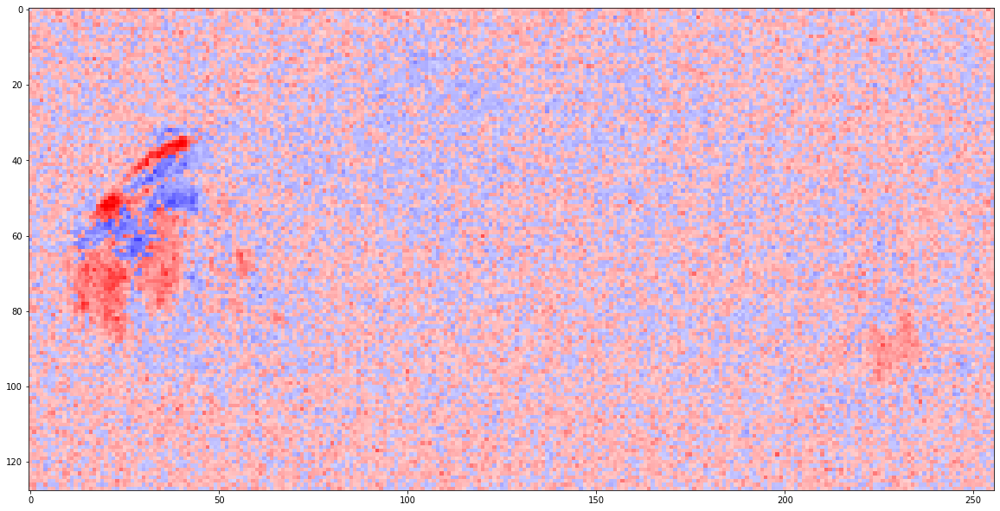

In [78]:
plt.figure(figsize=(20,20))
plt.imshow(maxs[:,:,21].T,vmin=-1.5,vmax=1.5,cmap='seismic')
circle1 = plt.Circle((0, 0), 0.2, color='r')
ax.add_patch(circle1)

In [21]:
# Yandan's trial
stas = []
for slice_num in [20,30]: #range(slice_nums):
    print(slice_num)
    
    ### load slice ###
    single_slice = load_slice(brain_path,slice_num)
        
    # interpolate & make interp object
    x = timestamps[:, slice_num]
    f = interp1d(x, single_slice, fill_value="extrapolate")
    xnew = np.arange(0, timestamps[-1,slice_num], 100)
    ynew = f(xnew)
    
    # set stim times to closest datapoint
    new_stim_timestamps = []
    for elem in list_in_ms0:
        new_elem = (elem//100)
        new_stim_timestamps.append(new_elem)
        
    #created the bin edges of the future arrays
    bin_start = 20 # 2 seconds before the stimulus is presented
    bin_end = 55 #5.5 seconds after the stimulus is presented
    chunk_edges=[]
    for elem in new_stim_timestamps:
        start = elem-bin_start
        end = elem + bin_end
        chunk = (start, end)
        chunk_edges.append(chunk)
        
    # make array of data points & loop over all presentations and average
    step_size = bin_end+bin_start+1
    dims = [np.shape(ynew)[0], np.shape(ynew)[1], step_size]
    running_sum = np.zeros(dims)
    for elem in chunk_edges:
        section = ynew[:,:, elem[0]:elem[1]+1]
        running_sum += section
    sta = running_sum / np.size(new_stim_timestamps)
    stas.append(sta)

20
30


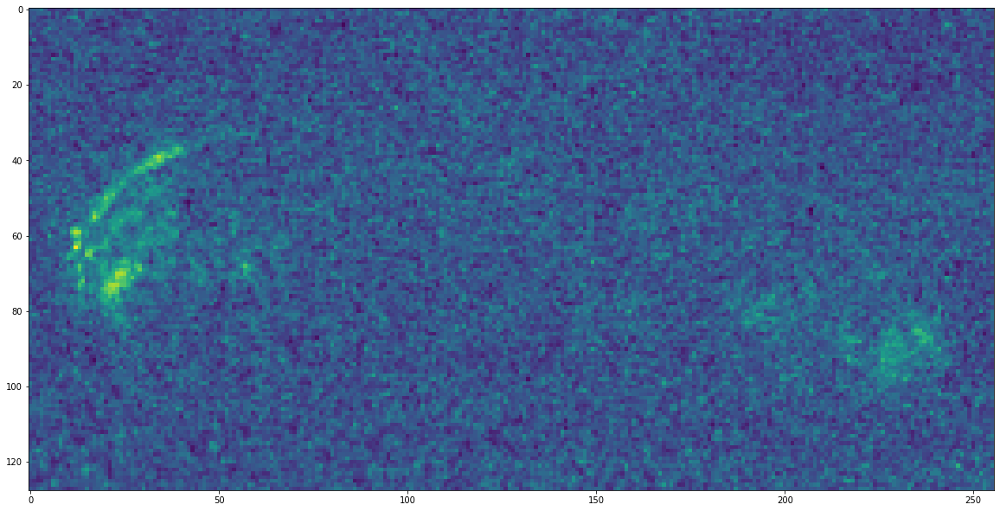

In [22]:
plt.figure(figsize=(20,20))
plt.imshow(stas[0][:,:,40].T)

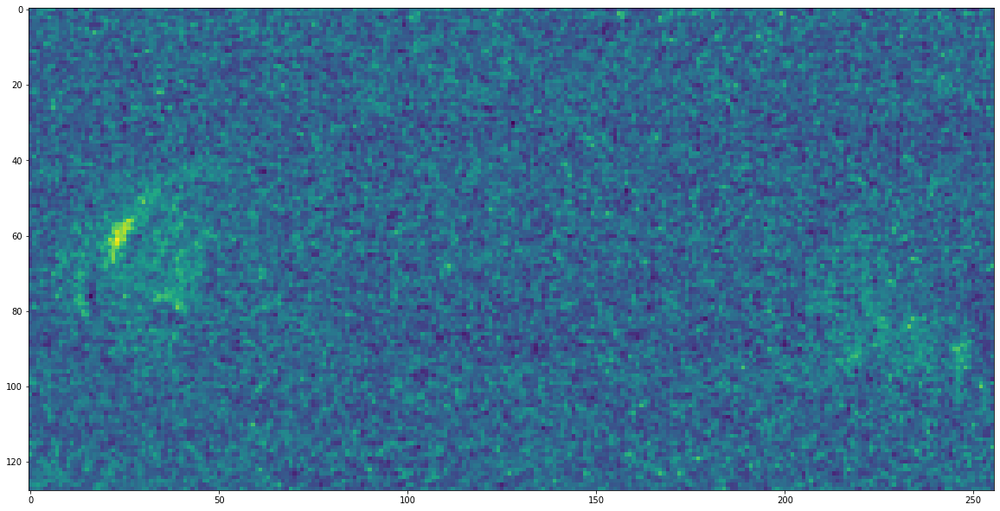

In [23]:
plt.figure(figsize=(20,20))
plt.imshow(stas[1][:,:,40].T)

In [59]:
# load slice 20
slice_num = 20
with h5py.File(brain_path, 'r') as hf:
    single_slice = hf['data'][:,:,slice_num,:]
# interpolate & make interp object
x = timestamps[:, slice_num]
f = interp1d(x, single_slice, fill_value="extrapolate")
xnew = np.arange(0, timestamps[-1,slice_num], 100)
ynew = f(xnew)

(256, 128, 18001)

In [110]:
# set stim times to closest datapoint
new_stim_timestamps = []
for elem in list_in_ms0:
    new_elem = (elem//100)
    new_stim_timestamps.append(new_elem)

In [87]:
#created the bin edges of the future arrays
bin_start = 20 # 2 seconds before the stimulus is presented
bin_end = 55 #5.5 seconds after the stimulus is presented
chunk_edges=[]
for elem in new_stim_timestamps:
    start = elem-bin_start
    end = elem + bin_end
    chunk = (start, end)
    chunk_edges.append(chunk)

In [107]:
# make array of data points & loop over all presentations and average
step_size = bin_end+bin_start+1
dims = [np.shape(ynew)[0], np.shape(ynew)[1], step_size]
running_sum = np.zeros(dims)
for elem in chunk_edges:
    section = ynew[:,:, elem[0]:elem[1]+1]
    running_sum += section
sta = running_sum / np.size(new_stim_timestamps)

In [111]:
sta.shape

(256, 128, 76)

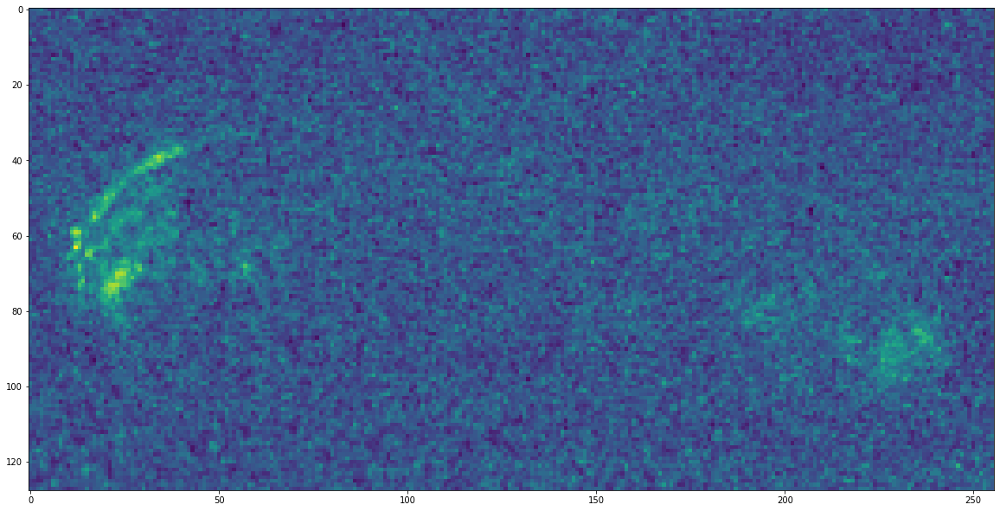

In [113]:
plt.figure(figsize=(20,20))
plt.imshow(sta[:,:,40].T)

In [124]:
os.mkdir('/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs/20220317_movie')

In [92]:
np.max(maxs)

2.859000634813065

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


/share/software/user/open/py-jupyter/1.0.0_py36/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74


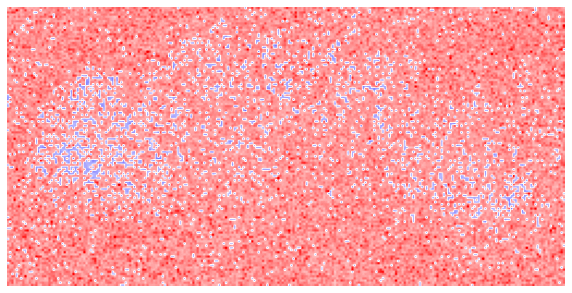

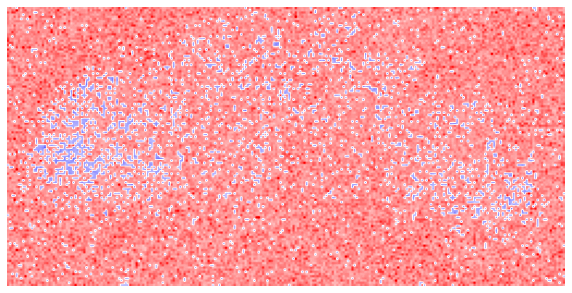

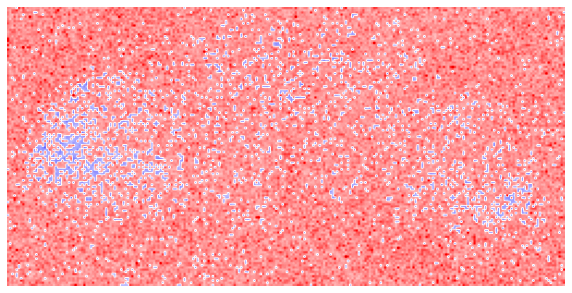

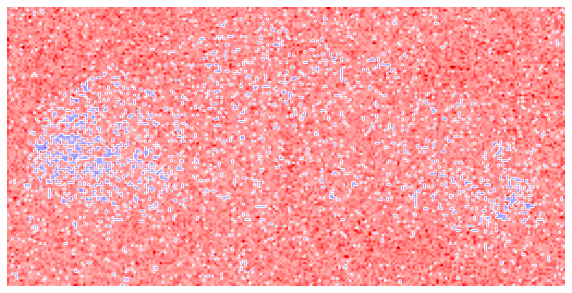

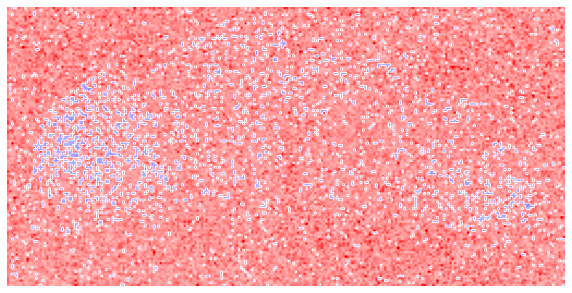

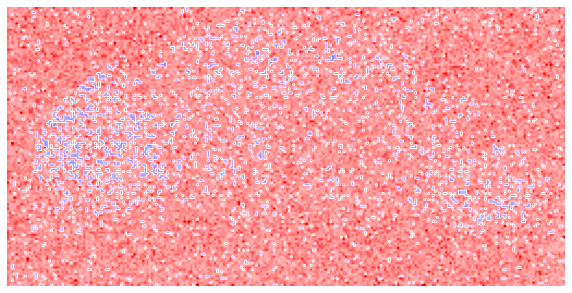

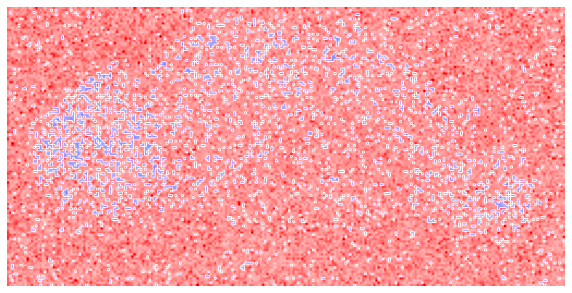

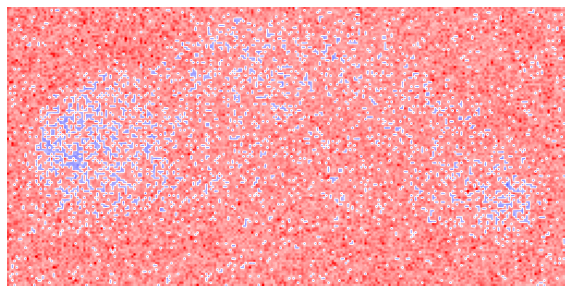

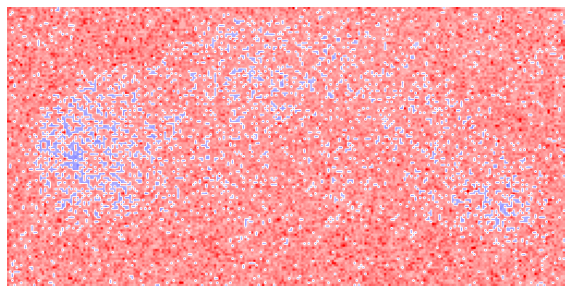

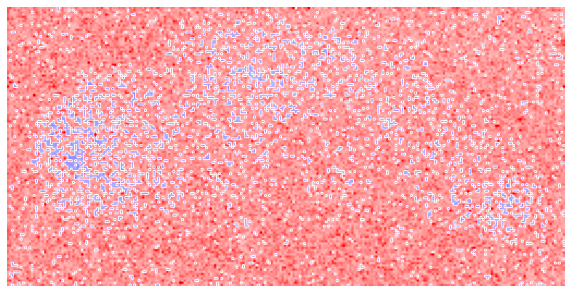

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


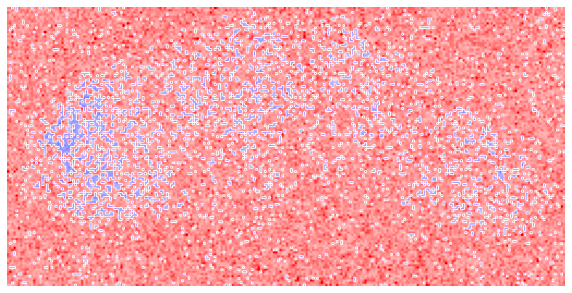

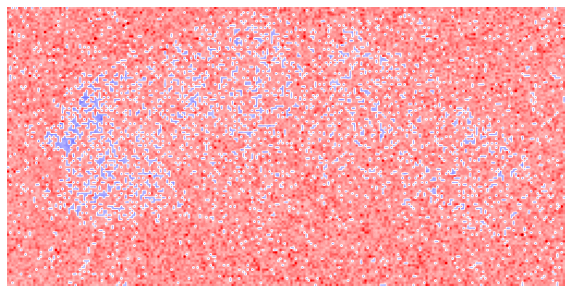

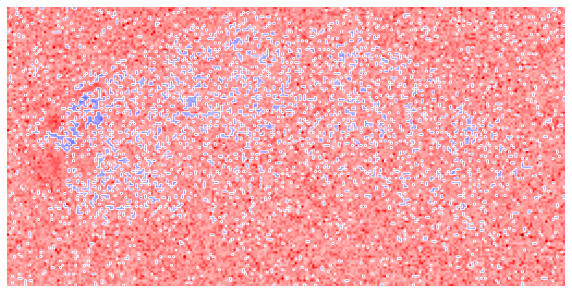

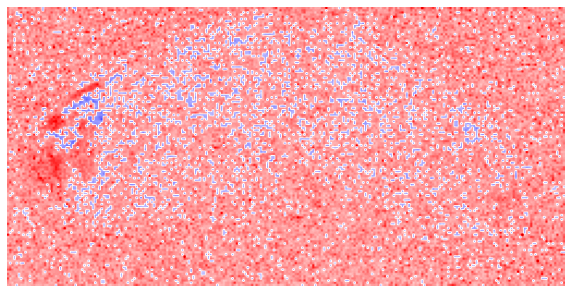

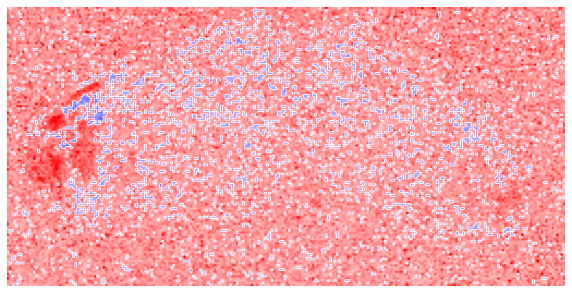

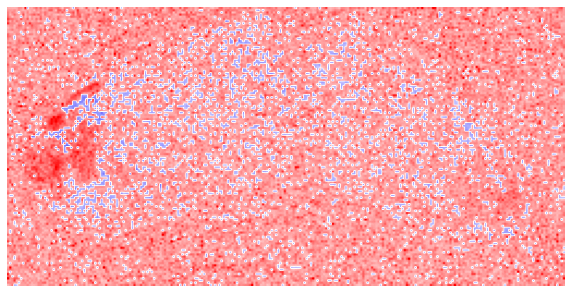

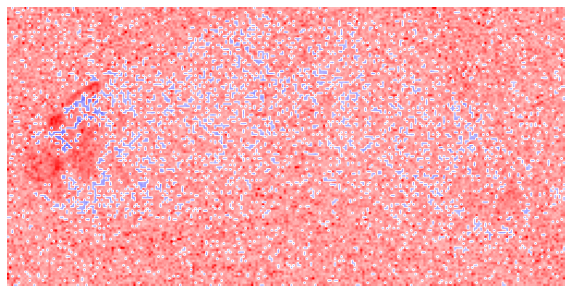

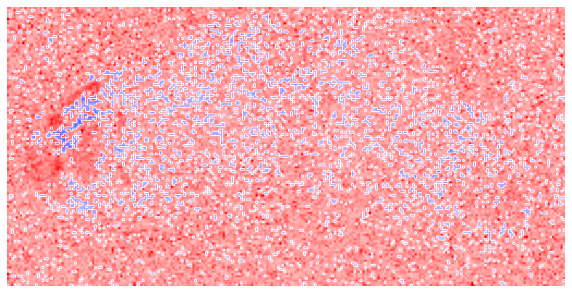

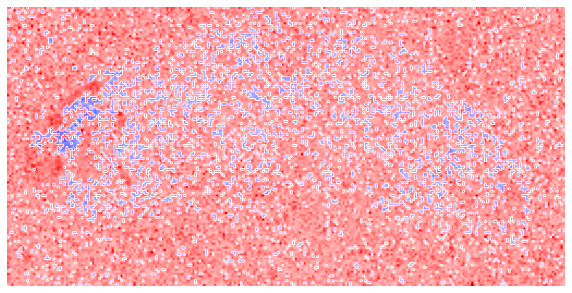

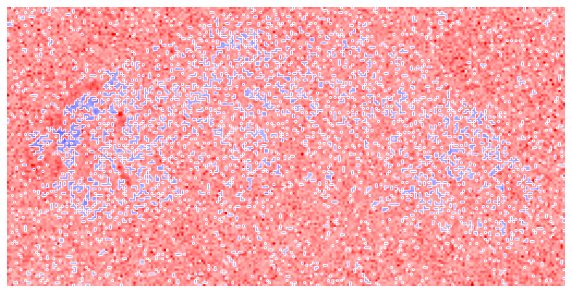

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


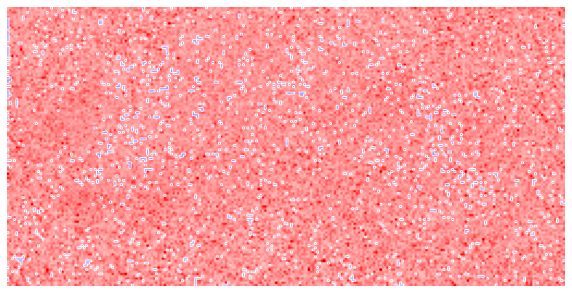

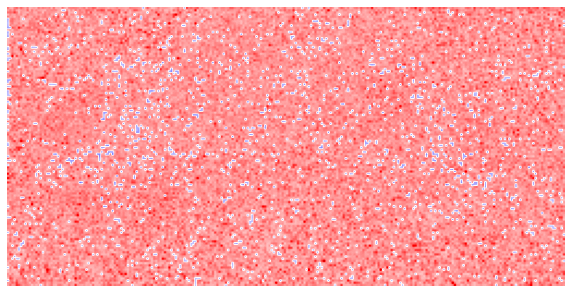

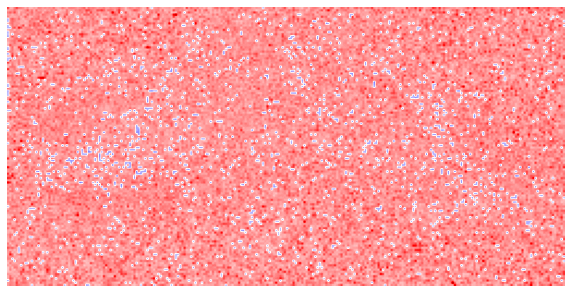

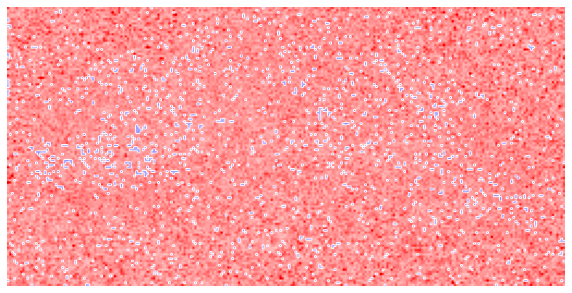

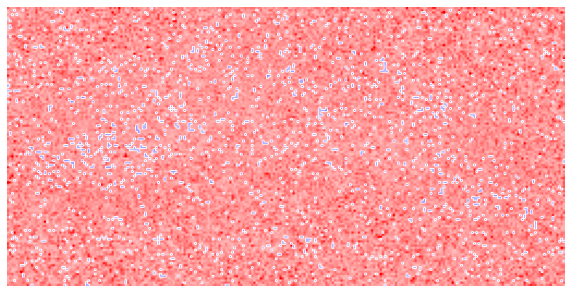

...

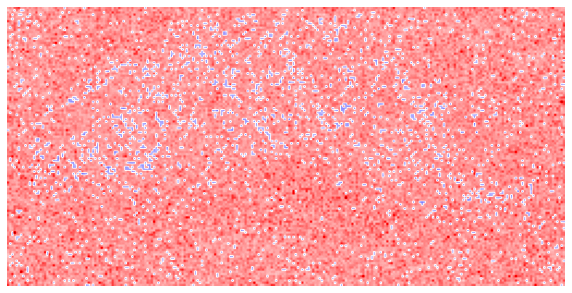

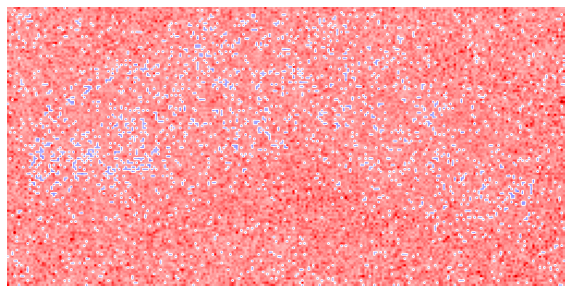

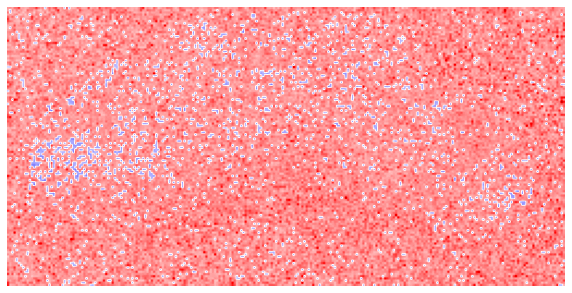

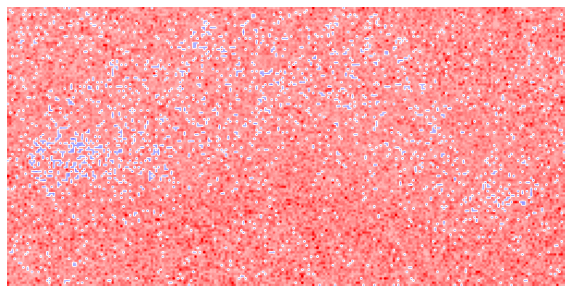

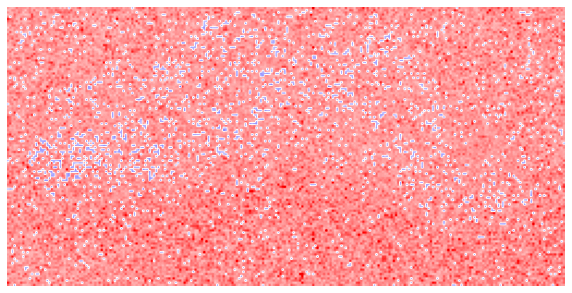

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


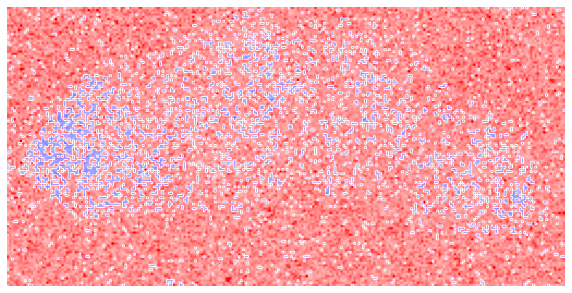

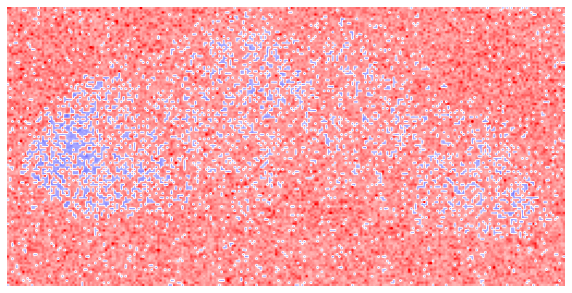

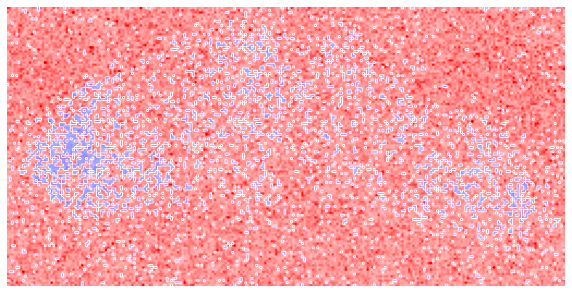

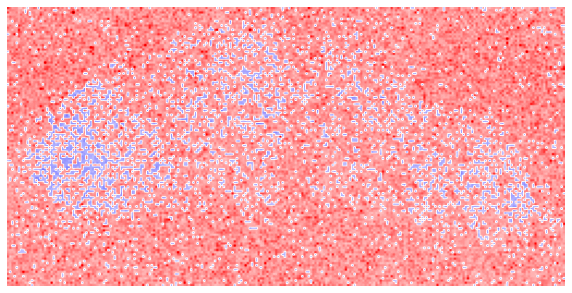

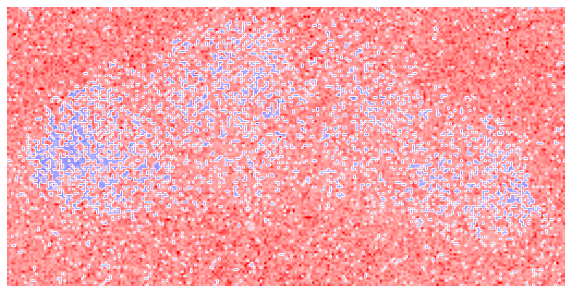

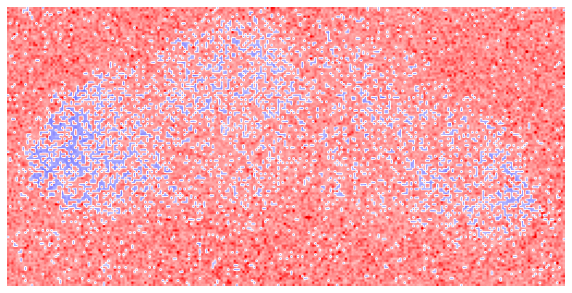

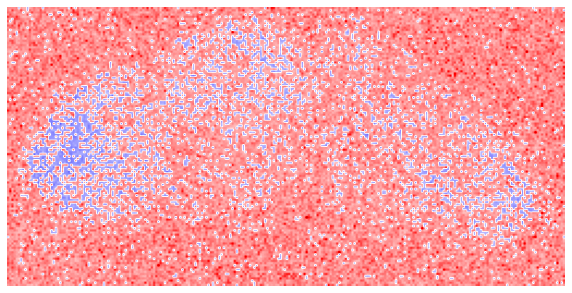

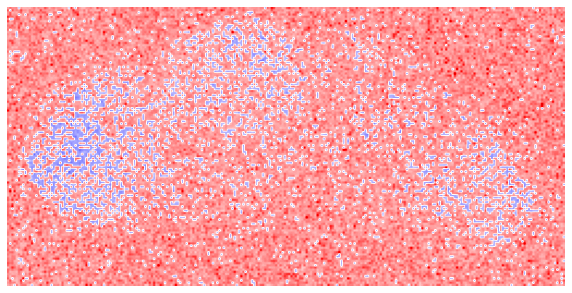

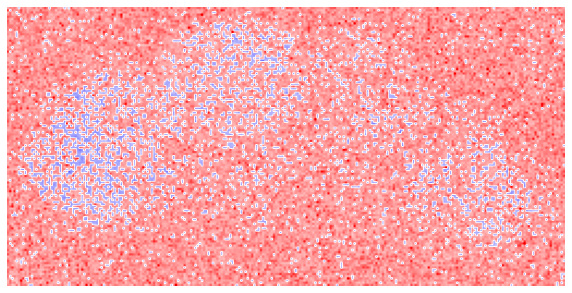

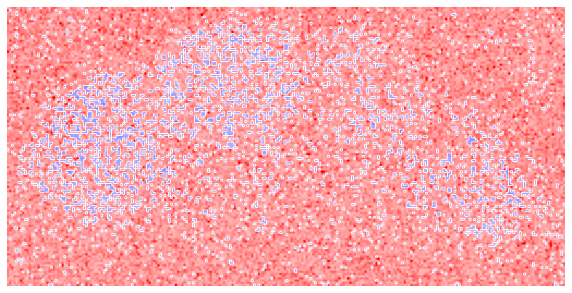

In [93]:


for i in range(75):
    plt.figure(figsize=(10,10))
    print(i)
    #plt.imshow(z_avg[:,:,i].T,vmin=0,vmax=.3)
    plt.imshow(maxs[:,:,i].T,vmin=-3,vmax=3,cmap='seismic')
    plt.axis('off')
    #save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs/20220321_movie'
    save_path = '/home/users/yandanw/20220321_movie_beh'
    fname = os.path.join(save_path, '{0:05d}.png'.format(i))
    plt.savefig(fname,dpi=100,bbox_inches='tight')

In [114]:
from matplotlib.gridspec import GridSpec

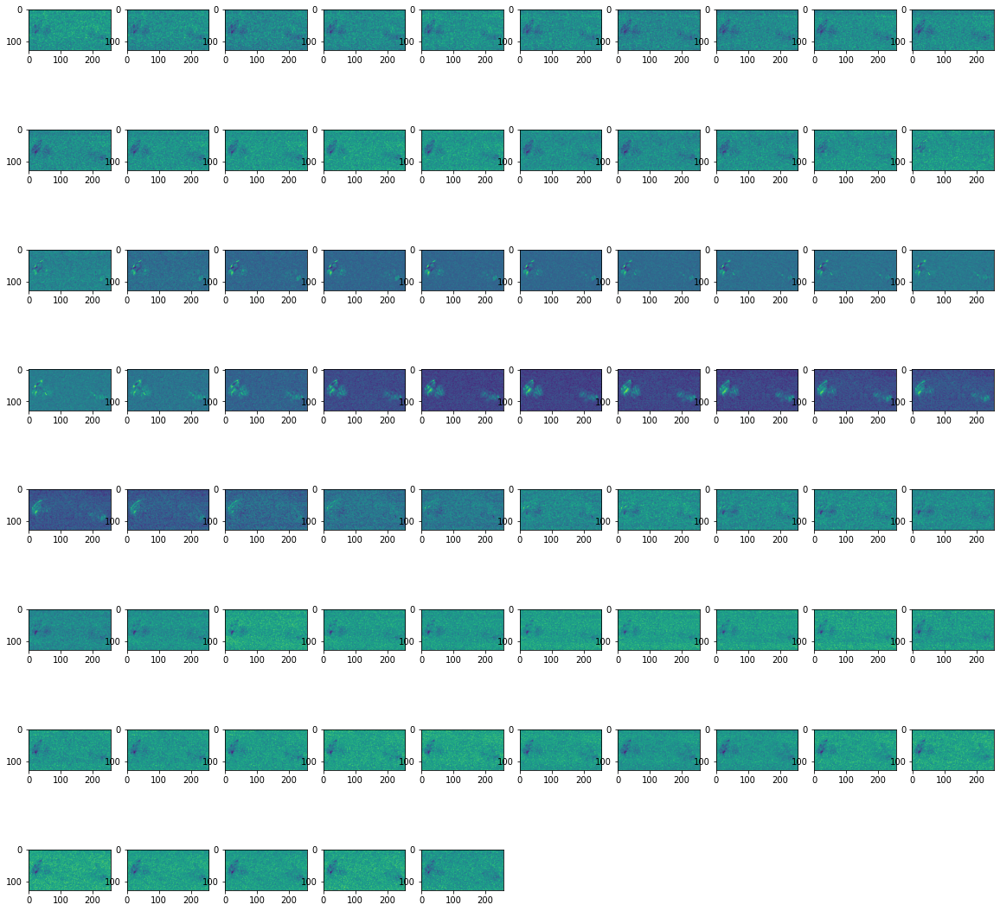

In [119]:
fig = plt.figure(figsize=(20,20))
gs = GridSpec(8,10)
for i in range(75):
    ax = fig.add_subplot(gs[i])
    ax.imshow(sta[:,:,i].T)
plt.show()